In [1]:
import csv
with open('crush-test0003.csv', mode = 'r') as file:
    csvFile = csv.reader(file)
    

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px

In [3]:
import pandas as pd

def subtract_from_csv_column(input_filename, output_filename, column_name, value_to_subtract):
    """
    Reads a CSV file, subtracts a value from a specified column,
    and saves the result to a new CSV file.
    """
    try:
        # Load the CSV file into a pandas DataFrame
        df = pd.read_csv(input_filename)

        # Ensure the column exists and is numeric (if necessary)
        if column_name not in df.columns:
            print(f"Error: Column '{column_name}' not found in the file.")
            return

        # Perform the subtraction
        # This operation is vectorized and efficient
        df[column_name] = pd.to_numeric(df[column_name], errors='coerce') - value_to_subtract

        # Save the modified DataFrame to a new CSV file
        df.to_csv(output_filename, index=False)
        print(f"Successfully modified '{column_name}' and saved to '{output_filename}'")

    except FileNotFoundError:
        print(f"Error: The file '{input_filename}' was not found.")
    except Exception as e:
        print(f"An error occurred: {e}")

# --- Example Usage ---
# Assume you have a file named 'data.csv' with a column 'Price'
input_csv = 'crush-test0003.csv'
output_csv = 'modified_data.csv'
target_column = 'time'
subtraction_amount = 503935

subtract_from_csv_column(input_csv, output_csv, target_column, subtraction_amount)


Successfully modified 'time' and saved to 'modified_data.csv'


In [4]:
df = pd.read_csv('modified_data.csv')
result =df.head(10)
print(result)

   time   gauge00   gauge01
0     0   3904661   3592508
1   458   3915681   3593575
2   926   3931983   3608337
3  1394   3927466   3600325
4  1862   3918825   3603148
5  2330   3904131   3599449
6  2798   3913432   3598610
7  3266   3907548   3602518
8  3734   3917185   3598032
9  4202   3921175   3588902


In [5]:
print(df.columns.tolist())


['time', ' gauge00', ' gauge01']


In [6]:
multiplier_quantity = 5/16777216
input_filename= 'modified_data.csv'
output_filename = 'updated_data.csv'

try:
    # Read the CSV file into a pandas DataFrame
    df = pd.read_csv(input_filename)

    # Remove leading/trailing spaces from column names
    df.columns = df.columns.str.strip()

    df['gauge00'] *= multiplier_quantity
    df['gauge01'] *= multiplier_quantity


    # Optional: Round the results for better formatting (e.g., Price to 2 decimal places)
    #df['Price'] = df['Price'].round(2)

    # Save the updated DataFrame to a new CSV file
    df.to_csv(output_filename, index=False)

    print(f"Successfully updated '{input_filename}' and saved to '{output_filename}'")
    print("\nUpdated DataFrame snippet:")
    print(df.head())

except FileNotFoundError:
    print(f"Error: The file '{input_filename}' was not found.")
except Exception as e:
    print(f"An error occurred: {e}")

Successfully updated 'modified_data.csv' and saved to 'updated_data.csv'

Updated DataFrame snippet:
   time   gauge00   gauge01
0     0  1.163680  1.070651
1   458  1.166964  1.070969
2   926  1.171822  1.075368
3  1394  1.170476  1.072980
4  1862  1.167901  1.073822


In [7]:
df = pd.read_csv('updated_data.csv')
result =df.head(10)
print(result)

   time   gauge00   gauge01
0     0  1.163680  1.070651
1   458  1.166964  1.070969
2   926  1.171822  1.075368
3  1394  1.170476  1.072980
4  1862  1.167901  1.073822
5  2330  1.163522  1.072719
6  2798  1.166294  1.072469
7  3266  1.164540  1.073634
8  3734  1.167412  1.072297
9  4202  1.168601  1.069576


In [8]:
import pandas as pd
import numpy as np

df = pd.read_csv('updated_data.csv')

print(df.head(10))

# Drop unwanted column
df = df.drop(columns=['gauge01'])

# Find max value
max_val = df['gauge00'].max()

# Remove rows where gauge00 equals the max (with float tolerance)
df = df[~np.isclose(df['gauge00'], max_val)]


   time   gauge00   gauge01
0     0  1.163680  1.070651
1   458  1.166964  1.070969
2   926  1.171822  1.075368
3  1394  1.170476  1.072980
4  1862  1.167901  1.073822
5  2330  1.163522  1.072719
6  2798  1.166294  1.072469
7  3266  1.164540  1.073634
8  3734  1.167412  1.072297
9  4202  1.168601  1.069576


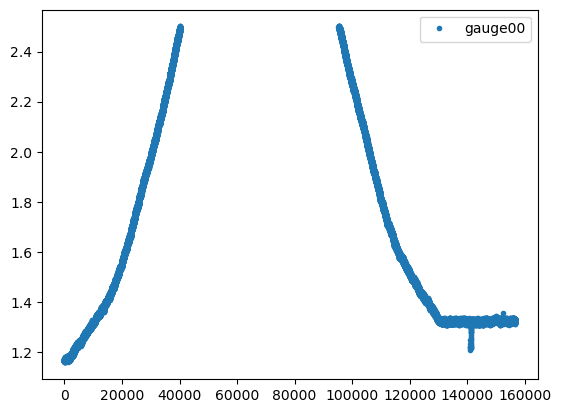

In [9]:


df['gauge00_smooth'] = df['gauge00'].rolling(window=50).mean()


# Plot (index = x, remaining columns = y)
#df.plot(kind='scatter',x='time',y='gauge00',s=1)
df.plot(y='gauge00', style='.', linestyle='None')
# Labels
#plt.xlabel(df.index.name)
plt.show()


In [10]:
fig = px.scatter(df, x=df.index, y='gauge00')
fig.show()